<a href="https://colab.research.google.com/github/nildiert/AA_1577350_R1_PROYECTO_MODELO_20180529_/blob/master/contornos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

El objetivo principal en este notebook es experimentar diferentes algoritmos de detección de bordes y segmentación de objetos. Con la intención de realizar un conteo de elementos posteriormente y encontrar la mayor cantidad de objetos. Ya que el conjunto de imágenes es muy pequeño se utilizaron algoritmos de procesamiento de imagenes, dejando de un lado el deep learning, sin embargo es posible que una de las técnicas más asertivas para este procedimiento este en usar [One shot learning](https://paperswithcode.com/paper/one-shot-object-detection-with-co-attention-1#code), generalmente es una técnica usada para face recognition, pero últimamente se ha hecho muy popular para la detección de objetos con datasets pequeños. 

También se sugiere revisar detalladamente el siguiente paper, ya que en este se plantea una solución al problema general utilizando diferentes datasets para preentrenar las redes neuronales

*   [Weakly Supervised Object Localization on grocery shelves using
simple FCN and Synthetic Dataset](https://arxiv.org/pdf/1803.06813.pdf)


A continuación implementaré diferentes algoritmos para encontrar patrones sencillos dentro del conjunto de imagenes



## Detección de bordes con Canny/hysteresis thresholding


El detector de bordes más común es `Canny edge detector`, usaré una implementación con la librería SimpleITK ya que esta optimizada para ello.

In [4]:
!pip install SimpleITK

     |████████████████████████████████| 44.9MB 91kB/s 


In [18]:
# Importación de librerías necesarias.

import numpy as np
from scipy import ndimage, misc
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
import pywt
import SimpleITK as sitk
import os
import cv2


Las imágenes se encuentran alojadas en una carpeta de mi cuenta de google drive. Cabe aclarar que es necesario pasar las imágenes por un conversor online para definir las características de un archivo `.PNG`, ya que las enviadas no tenían la composición del alfa bien definida y la librería con la que se procesaron las imágenes lo requería. [Link al conversor de imágenes](https://cloudconvert.com/heic-to-png)

In [19]:
# Importación de librerías para usar archivos de google drive

# Accessing My Google Drive
from google.colab.patches import cv2_imshow
from google.colab import drive
drive.mount('/content/drive')

%matplotlib inline

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [20]:
# Escaneamos todo lo que se encuentra en la carpeta de imagenes, 
# con el fin de usar el path de cada una de las imagenes. 
# El path de cada imagen esta almacenado en el array images_path 
directory = "/content/drive/My Drive/ml-images/"
images_path = []

for img in os.listdir(directory):
  path = directory + img
  images_path.append(path)
  

In [21]:
image_path = images_path[0]

# Leemos la imagen y la convertimos en float64
image = sitk.ReadImage(image_path, sitk.sitkInt8)
image = sitk.Cast(image, sitk.sitkFloat64)

In [22]:
# Calculamos el filtro Canny un valor de σ del desenfoque gaussiano (3)
edges2 = sitk.CannyEdgeDetection(image, lowerThreshold=5, upperThreshold=10, variance=[3, 3])

In [23]:
# Convertimos el output a un array numpy para su vi
image = sitk.GetArrayFromImage(image)
edges2 = sitk.GetArrayFromImage(edges2)

La siguiente es la imagen contorneada, a diferencia de los otros métodos usados en el presente notebook, este es el método que nos permite tener mayor claridad en la imagen, esto permitiría para futuras oportunidades procesar los textos dentro de cada empaque y encontrar similitudes entre ellos.

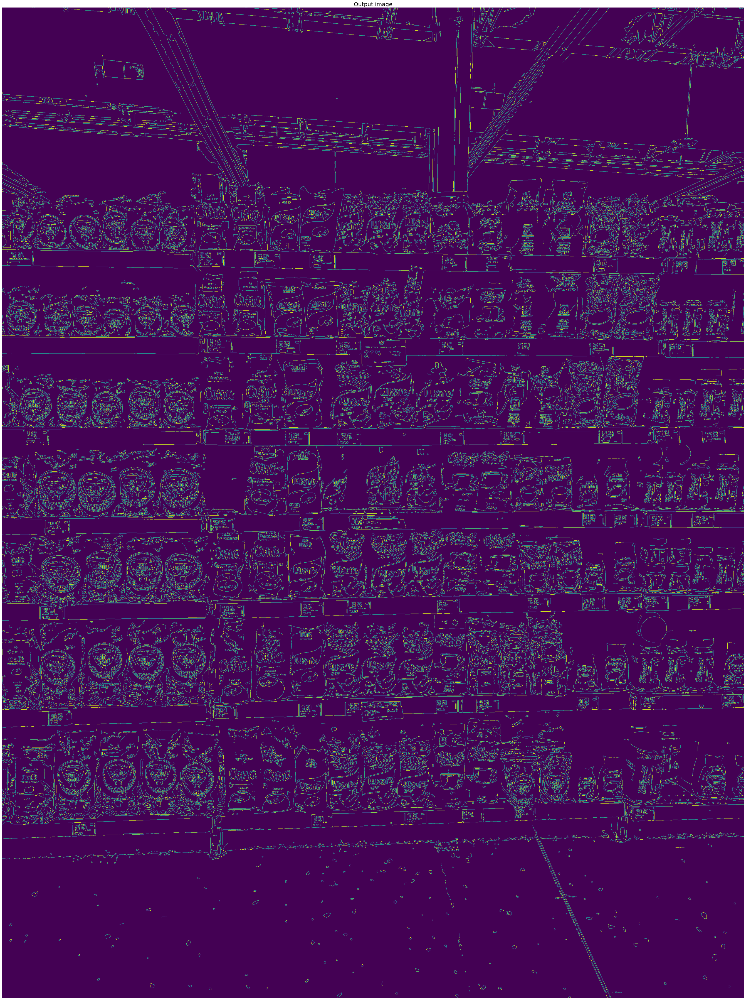

In [36]:
# Utilizamos matplotlib para la visualización de las imágenes. 
fig = plt.figure(figsize=(100, 50))

plt.subplot(111), plt.imshow(edges2), plt.axis('off')
plt.title('Output image', fontsize=20)

fig.tight_layout()
plt.show()



## Segmentación de imagenes con Morphological watershed

La segmentación de imágenes es la división de una imagen en distintas regiones o categorías que corresponden a diferentes objetos o partes de objetos.

Los siguientes son los pasos involucrados en la segmentación de una imagen por watershed transformation:


1.   Encuentre los marcadores y el criterio de segmentación (la función que se utilizará para dividir las regiones; a menudo, este es el contraste / gradiente).
2.   Ejecute un algoritmo watershed controlado por marcadores con estos dos elementos.





In [27]:
# Importación de librerías

from scipy import ndimage as ndi
from skimage.morphology import watershed, binary_dilation, binary_erosion, remove_small_objects
from skimage.morphology import disk, square
from scipy.ndimage import distance_transform_edt
from skimage.measure import label, regionprops
from skimage.segmentation import clear_border
from skimage.filters import rank, threshold_otsu
from skimage.feature import peak_local_max, blob_log
from skimage.util import img_as_ubyte
from skimage.io import imread
from skimage.color import rgb2gray
import numpy as np
import matplotlib.pyplot as plt
import os
from google.colab.patches import cv2_imshow

In [28]:
# Accessing My Google Drive
from google.colab import drive
from IPython import display
drive.mount('/content/drive')

%matplotlib inline

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [29]:
## Getting all the images
directory = "/content/drive/My Drive/ml-images/"
images_path = []

for img in os.listdir(directory):
  path = directory + img
  images_path.append(path)

In [40]:
# Lectura de la imagen y conversión a escala de grises
image = img_as_ubyte(rgb2gray(imread(images_path[0]))) #img_as_ubyte(data.camera())



In [39]:
# calculo de la distancia euclidiana
distance = ndi.distance_transform_edt(image)
# Encuentro picos para usarlos como marcadores para el algoritmo
local_maxi = peak_local_max(distance, indices=False, footprint=np.ones((3, 3)), labels=image)
markers = ndi.label(local_maxi)[0]


In [41]:
# Ejecutamos el algoritmo watershed con el marcador creado
# Así encontramos las etiquedas de segmentación
labels = watershed(-distance, markers, mask=image)
# Retiramos los ruidos pequeños para eliminar el ruido
labels = remove_small_objects(labels, min_size=100)


In [42]:
# Calculamos la cantidad de objetos segmentados en la salida y la cantidad de clases únicas
props = regionprops(labels)
print(len(np.unique(labels)), len(props))


4840 4839


<Figure size 432x288 with 0 Axes>

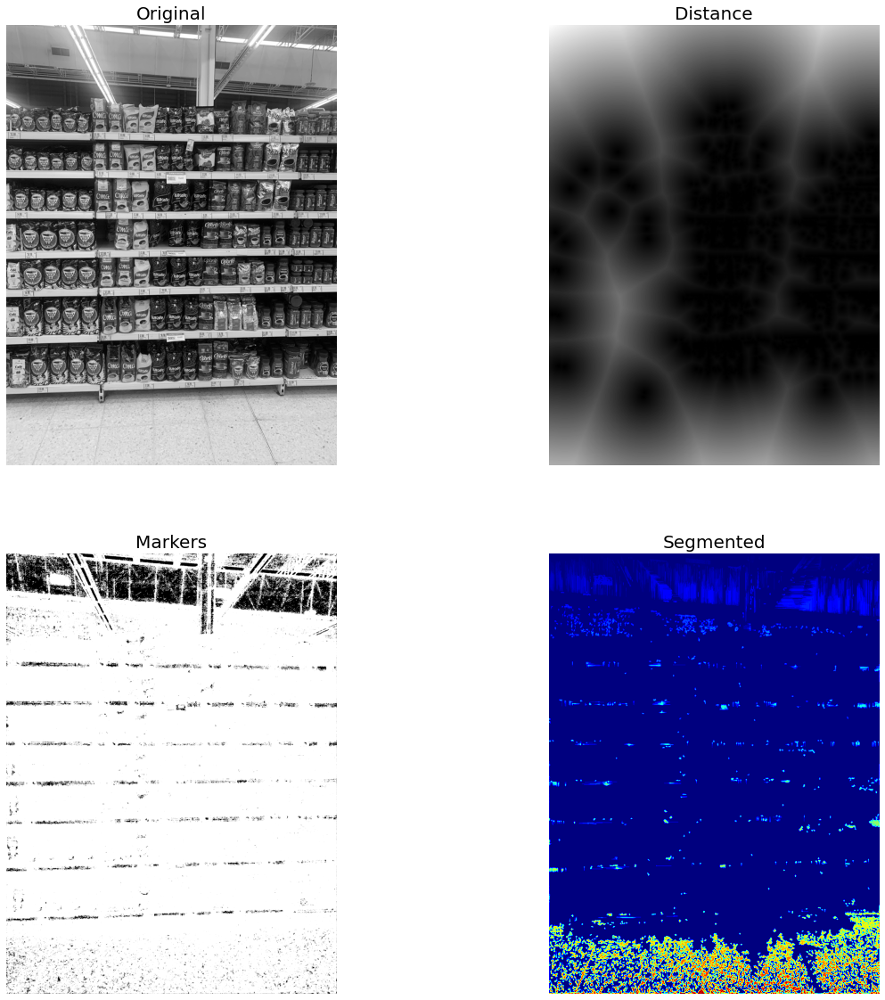

In [43]:
# Graficamos las imagenes segmentadas
plt.gray()
plt.figure(figsize=(20,20))
plt.subplot(221), plt.imshow(image), plt.axis('off'), plt.title('Original', size=20)
# Graficamos el mapa de distancias entre cada imagen segmentada
plt.subplot(222), plt.imshow(distance), plt.axis('off'), plt.title('Distance', size=20)

plt.subplot(223), plt.imshow(binary_dilation(markers, disk(2))), plt.axis('off'), plt.title('Markers', size=20)
plt.subplot(224), plt.imshow(labels, cmap='jet'), plt.axis('off'), plt.title('Segmented', size=20)
plt.show()


In [56]:
# Ejecutamos el algoritmo de nuevo, pero esta vez, con el gradiente y el marcador como entrada
# (Usamos el gradiente local como un disco de un radio pequeño, 2, para mantener los bordes delgados):


image = img_as_ubyte(rgb2gray(imread(images_path[0])))
denoised = rank.median(image, disk(2))

markers = rank.gradient(denoised, disk(5)) < 20
markers = ndi.label(markers)[0]

# Gradiente local (disk(2) mantiene los bordes delgados)
gradient = rank.gradient(denoised, disk(2))

# Aplicamos el algoritmo de nuevo y removemos objetos pequeños
labels = watershed(gradient, markers)
labels = remove_small_objects(labels, min_size=100)
props = regionprops(labels)
print(len(np.unique(labels)), len(props))


6434 6433


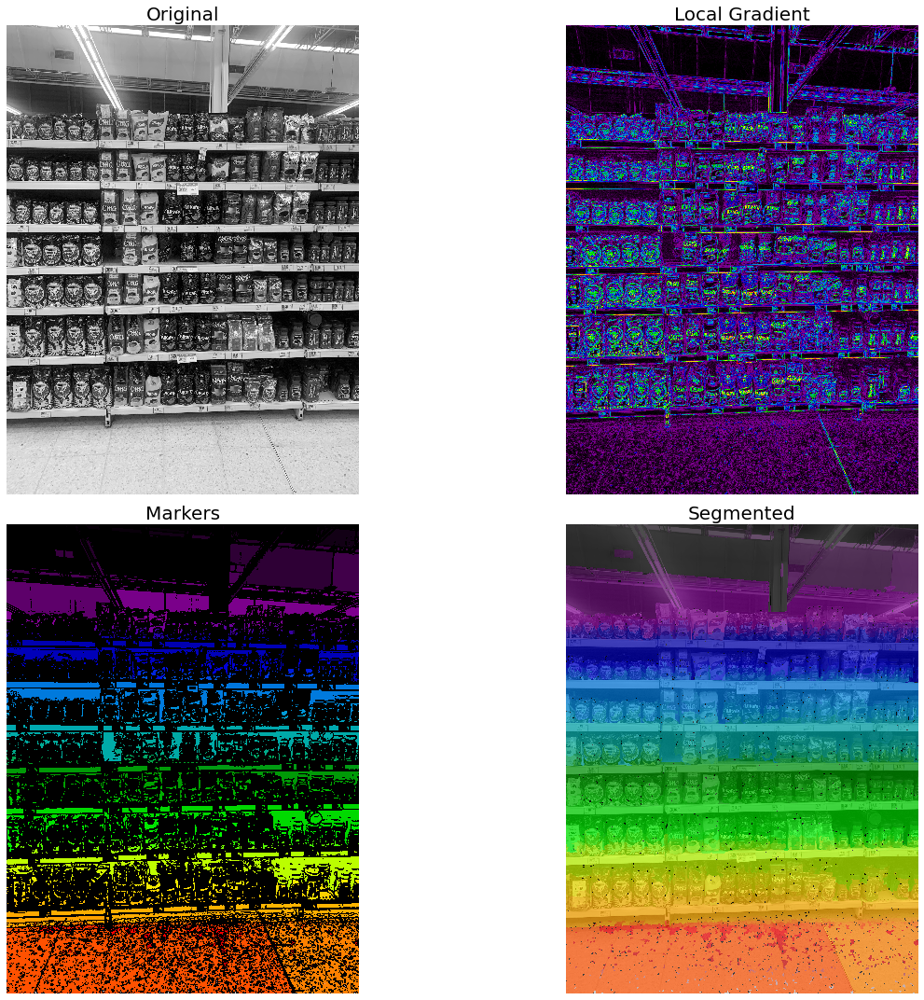

In [46]:

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 15), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image, cmap=plt.cm.gray, interpolation='nearest')
ax[0].set_title("Original", size=20)

ax[1].imshow(gradient, cmap=plt.cm.nipy_spectral, interpolation='nearest')
ax[1].set_title("Local Gradient", size=20)

ax[2].imshow(markers, cmap=plt.cm.nipy_spectral, interpolation='nearest')
ax[2].set_title("Markers", size=20)

ax[3].imshow(image, cmap=plt.cm.gray, interpolation='nearest')
ax[3].imshow(labels, cmap=plt.cm.nipy_spectral, interpolation='nearest', alpha=.7)
ax[3].set_title("Segmented", size=20)

for a in ax:
    a.axis('off')

fig.tight_layout()
plt.show()

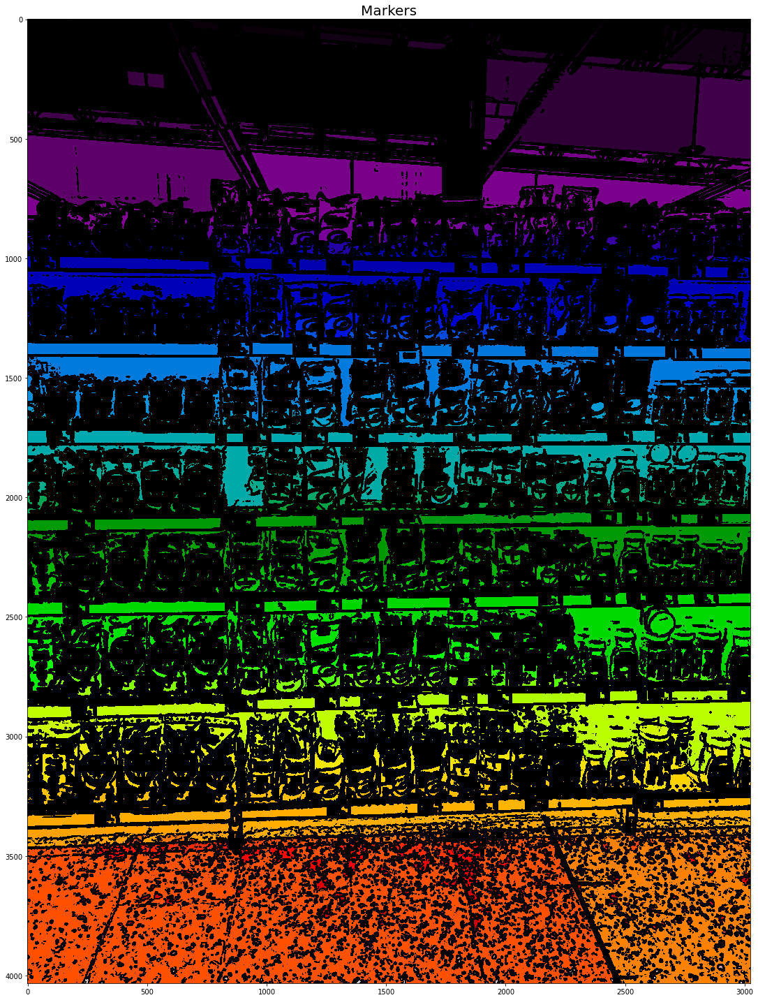

In [53]:
fig = plt.figure(figsize=(50, 20))

plt.subplot(111), plt.imshow(markers, cmap=plt.cm.nipy_spectral, interpolation='nearest')
plt.title('Markers', fontsize=20)

fig.tight_layout()
plt.show()

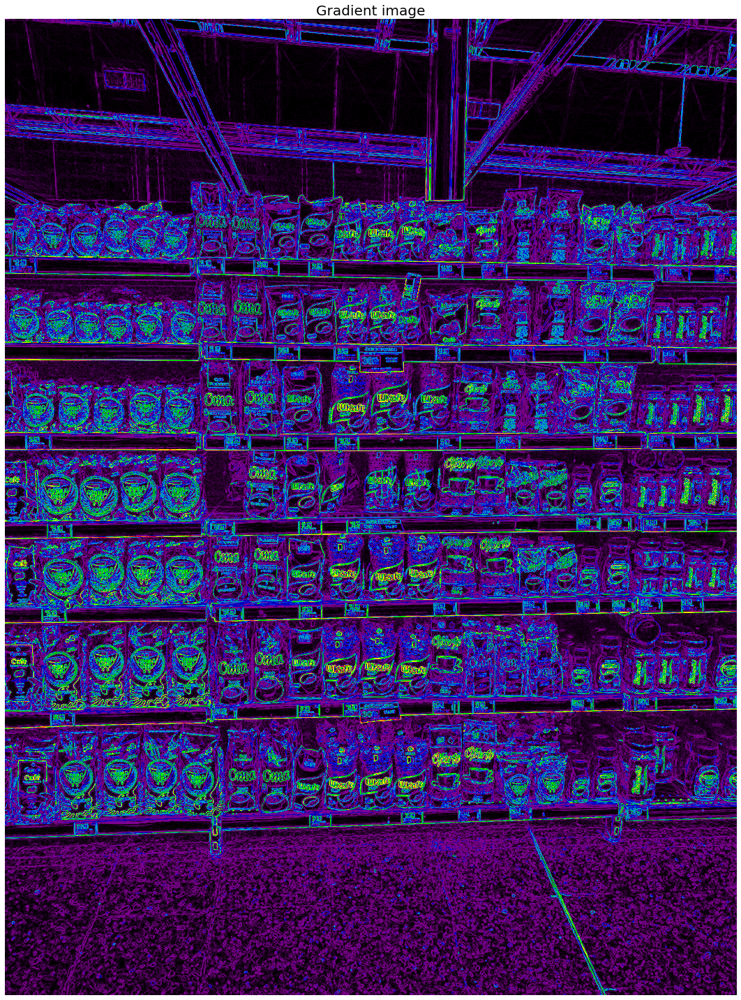

In [55]:
fig = plt.figure(figsize=(50, 20))

plt.subplot(111), plt.imshow(gradient, cmap=plt.cm.nipy_spectral, interpolation='nearest'), plt.axis('off')
plt.title('Gradient image', fontsize=20)

fig.tight_layout()
plt.show()

A diferencia del método anterior, este nos permite tener contornos más delineados, sin embargo toma un contorno de cada elemento de la imagen, probablemente realizando una segmentación por color se obtendrían resultados más interesantes. 

# Segmentación con watershed

Este algoritmo es comunmente usado para realizar la segmentación de bacterias, dados algunos resultados interesantes decidí usarlo con el fin de crear una segmentación binaria que permita encontrar elementos de una manera más sencilla.

* [Image Segmentation with Watershed Algorithm
](https://docs.opencv.org/master/d3/db4/tutorial_py_watershed.html)

In [57]:
import numpy as np
from scipy import ndimage, misc
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
import pywt
import SimpleITK as sitk
import os
import cv2
from google.colab.patches import cv2_imshow

In [59]:
# Leemos la imagen y separamos el primer plano (objetos) del fondo utilizando un umbral con un umbral elegido manualmente. 
img = sitk.ReadImage(images_path[0], sitk.sitkFloat32)
f = sitk.RescaleIntensityImageFilter()
img = f.Execute(img)


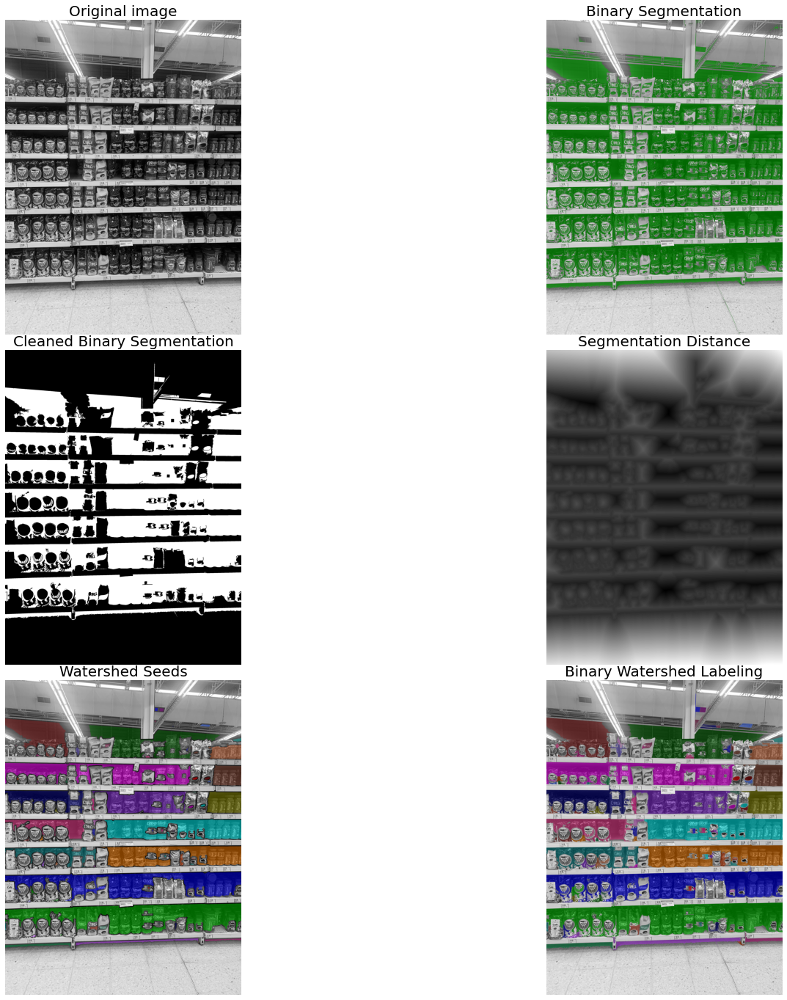

In [106]:

plt.figure(figsize=(20,26))
plt.gray()
# Esta linea solo da unos parametros para mostrar la imagen, no prestar mayor atención
plt.subplots_adjust(0,0,1,0.95,0.05,0.05), plt.axis('off')
plt.subplot(421), plt.imshow(sitk.GetArrayFromImage(img)), plt.title('Original image', size=20), plt.axis('off')

# El umbral lo declaramos manualmente para que el algoritmo realice la segmentación
thresh_value = 110

# Colocamos un rango de umbral, para que tome valores entre cierta medida
# si los valores son muy grandes, se toma el techo y el piso en la imagen,
# al colocar img < 100 se evita esto
thresh_img = img > thresh_value and img < 90
plt.subplot(422), plt.imshow(sitk.GetArrayFromImage(sitk.LabelOverlay(img, thresh_img))/255), plt.title('Binary Segmentation', size=20), plt.axis('off')

# Eliminamos  pequeños componentes
cleaned_thresh_img = sitk.BinaryOpeningByReconstruction(thresh_img, [15, 15, 15])
cleaned_thresh_img = sitk.BinaryClosingByReconstruction(cleaned_thresh_img, [15, 15, 15])

plt.subplot(423), plt.imshow(sitk.GetArrayFromImage(cleaned_thresh_img)), plt.title('Cleaned Binary Segmentation', size=20), plt.axis('off')

# calculamos el mapa de distancias, esto nos permite tener una idea más clara de los elementos 
# que se estan teniendo en cuenta en la segmentación. 
dist_img = sitk.SignedMaurerDistanceMap(cleaned_thresh_img != 0, insideIsPositive=False, squaredDistance=False, useImageSpacing=False)
radius = 10

# Etiquetamos todos los elementos consecutivos, mientras removemos los elementos con menos de 15 pixeles

seeds = sitk.ConnectedComponent(dist_img < -radius)
seeds = sitk.RelabelComponent(seeds, minimumObjectSize=15)
# Run the watershed segmentation using the distance map and seeds.
ws = sitk.MorphologicalWatershedFromMarkers(dist_img, seeds, markWatershedLine=True)
ws = sitk.Mask( ws, sitk.Cast(cleaned_thresh_img, ws.GetPixelID()))
img = sitk.Cast(img, sitk.sitkUInt8)

plt.subplot(424), plt.imshow(sitk.GetArrayFromImage(dist_img)), plt.title('Segmentation Distance', size=20), plt.axis('off')
plt.subplot(425), plt.imshow(sitk.GetArrayFromImage(sitk.LabelOverlay(img, seeds))), plt.title('Watershed Seeds', size=20), plt.axis('off')
plt.subplot(426), plt.imshow(sitk.GetArrayFromImage(sitk.LabelOverlay(img, ws))), plt.title('Binary Watershed Labeling', size=20), plt.axis('off')
plt.show()

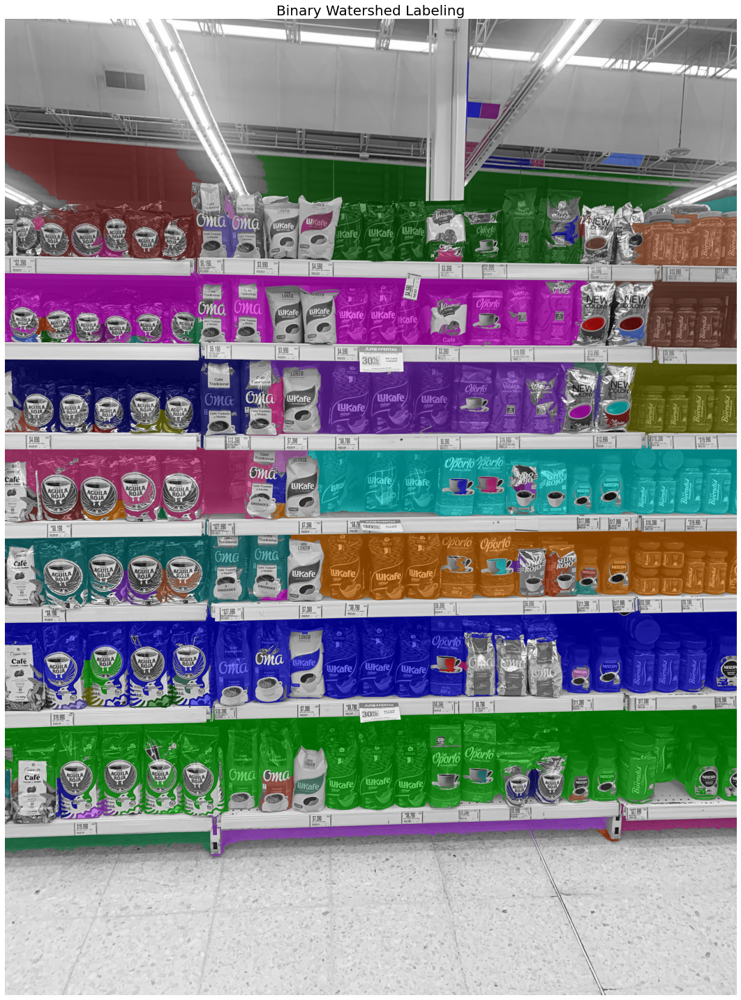

In [102]:
fig = plt.figure(figsize=(50, 20))

plt.subplot(111), plt.imshow(sitk.GetArrayFromImage(sitk.LabelOverlay(img, ws))), plt.axis('off')
plt.title('Binary Watershed Labeling', fontsize=20)

fig.tight_layout()
plt.show()